# STYLE-ALIGNED WITH REFERENCE IMAGE \& CONTENT-AWARENESS  (IMG+AUDIO)

In [1]:
# Clone the repository
!git clone https://github.com/alessioborgi/StyleAligned_MultiReference-MultiModal.git

# Change directory to the cloned repository
%cd StyleAligned_MultiReference-MultiModal
%ls

# Set up Git configuration
# !git config --global user.name "Alessio Borgi"
# !git config --global user.email "alessioborgi3@gmail.com"

!git config --global user.name "Name Surname"
!git config --global user.email "email@gmail.com"

# Stage the changes
#!git add .

# Commit the changes
#!git commit -m "Added some content to your-file.txt"

# Push the changes (replace 'your-token' with your actual personal access token)
#!git push origin main

Cloning into 'StyleAligned_MultiReference-MultiModal'...
remote: Enumerating objects: 1656, done.
remote: Counting objects: 100% (493/493), done.
remote: Compressing objects: 100% (310/310), done.
remote: Total 1656 (delta 186), reused 472 (delta 172), pack-reused 1163 (from 1)
Receiving objects: 100% (1656/1656), 1.40 GiB | 16.48 MiB/s, done.
Resolving deltas: 100% (427/427), done.
Updating files: 100% (985/985), done.
/content/StyleAligned_MultiReference-MultiModal
 audio/
 imgs/
 LICENSE
 music/
 README.md
 requirements.txt
 src/
 StyleAligned_ControlNet.ipynb
 StyleAligned_Explanation.ipynb
 StyleAligned_Focused_Attention_Explanation.ipynb
 StyleAligned_Metrics.ipynb
'StyleAligned_MultiReference_Linear(3-styles).ipynb'
 StyleAligned_MultiReference_Linear.ipynb
'StyleAligned_MultiReference_Slerp(3-styles).ipynb'
 StyleAligned_MultiReference_Slerp.ipynb
 StyleAligned_MultiScale_AdaIN_Explanation.ipynb
 StyleAligned_Prompts.ipynb
'StyleAligned_Ref&Content(Audio).ipynb'
'StyleAligned_R

In [2]:
# Install the required packages
!pip install -r requirements.txt > /dev/null

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albucore 0.0.16 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
albumentations 1.4.15 requires numpy>=1.24.4, but you have numpy 1.23.5 which is incompatible.
bigframes 1.19.0 requires numpy>=1.24.0, but you have numpy 1.23.5 which is incompatible.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
jax 0.4.33 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
jaxlib 0.4.33 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
xarray 2024.9.0 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.


In [3]:
from __future__ import annotations
import cv2
import copy
import torch
import einops
import mediapy
import numpy as np
from PIL import Image
import torch.nn as nn
from tqdm import tqdm
from typing import Any
from typing import Callable
from dataclasses import dataclass
from diffusers.utils import load_image
from torch.nn import functional as nnf
from diffusers.models import attention_processor
from diffusers.image_processor import PipelineImageInput
from transformers import DPTImageProcessor, DPTForDepthEstimation
from diffusers.utils.torch_utils import is_compiled_module, is_torch_version
from diffusers import StableDiffusionXLPipeline, DDIMScheduler, ControlNetModel, StableDiffusionXLControlNetPipeline, AutoencoderKL

from src.Handler import Handler
from src.StyleAlignedArgs import StyleAlignedArgs
from src.Tokenization_and_Embedding import prompt_tokenizazion_and_embedding, embeddings_ensemble, embeddings_ensemble_with_neg_conditioning
from src.Encode_Image import image_encoding
from src.Diffusion import Generate_Noise_Prediction, Denoising_next_step, DDIM_Process, extract_latent_and_inversion, DDIM_Inversion_Process

# For the Blip model (Content Image).
import os
from transformers import BlipProcessor, BlipForConditionalGeneration

# For the Whisper model (Content Audio).
from transformers import WhisperProcessor, WhisperForConditionalGeneration
import librosa

# For the Summarization and rephrasing.
from transformers import T5ForConditionalGeneration, T5Tokenizer


# Create Alias for torch.tensor to increase readability.
T = torch.tensor
TN = T

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/usr/local/lib/python3.10/dist-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


#### Model Load

In [4]:
# Create a DDIMScheduler object with specific parameters
scheduler = DDIMScheduler(
    beta_start=0.00085,            # Starting value of beta for the noise schedule
    beta_end=0.012,                # Ending value of beta for the noise schedule
    beta_schedule="scaled_linear", # Type of beta schedule to use, here it is scaled linear
    clip_sample=False,             # Whether to clip the samples to a certain range
    set_alpha_to_one=False         # Whether to set alpha to one
)

# Load the Stable Diffusion XL Reference_Pipeline with a pretrained model
Reference_Pipeline = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",  # Model name or path
    torch_dtype=torch.float16,                   # Data type for PyTorch tensors
    variant="fp16",                              # Variant of the model, here it is fp16 (16-bit floating point)
    use_safetensors=True,                        # Whether to use safe tensors
    scheduler=scheduler                          # Use the scheduler defined above
).to("cuda")                                     # Move the pipeline to the CUDA device (GPU)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [5]:
# 1) VanGogh Painting
# Set the source style, prompt and path.
src_style = "Van Gogh round painting"
src_prompt = f'The starry night, {src_style}.'
reference_image_path = './imgs/original.jpg'

# 2) Cubism Painting
# src_style = "cubism painting"
# src_prompt = f'Two men smoking water pipe, {src_style}.'
# reference_image_path = './imgs/Picasso_Smoking_Water_Pipe.jpeg'


# 3) Kid Drawing
# src_style = "Kid Drawing"
# src_prompt = f'A city with two houses and a church, {src_style}.'
# reference_image_path = './imgs/kid_drawing.jpeg'

# 4) Medieval Painting
# src_style = "Medieval Painting"
# src_prompt = f'Man laying in a bed, {src_style}.'
# reference_image_path = './imgs/medieval-bed.jpeg'

# Setting the number of inference steps in the Diffusion Inversion Process.
num_inference_steps = 50

# Setting the Guidance Scale for the Diffusion Inversion Process.
guidance_scale = 25.0

# 1) Normal Painting
# These are some parameters you can Adjust to Control StyleAlignment to Reference Image.
#style_alignment_score_shift = np.log(2)  # higher value induces higher fidelity, set 0 for no shift
#style_alignment_score_scale = 1.0  # higher value induces higher, set 1 for no rescale

# 2) Very Famous Paintings
style_alignment_score_shift = np.log(1)
style_alignment_score_scale = 0.5

Reference Image for Style Alignment

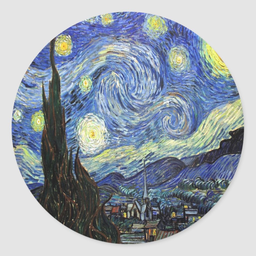

In [6]:
# Load the reference image and resize it to 1024x1024 pixels.
ref_image = np.array(load_image(reference_image_path).resize((1024, 1024)))

# Display the output image.
mediapy.show_image(ref_image, title="Reference Image for Style Alignment", height=256)

In [7]:
# Defining a type alias for the Diffusion Inversion Process type of callable.
Diff_Inversion_Process_Callback = Callable[[StableDiffusionXLPipeline, int, T, dict[str, T]], dict[str, T]]

### CONTENT IMAGE USING BLIP-1

In [8]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [9]:
def generate_description(image):
    inputs = processor(image, return_tensors="pt")
    out = model.generate(**inputs)
    description = processor.decode(out[0], skip_special_tokens=True)
    return description

In [10]:
def load_content_images(image_paths):
    """
    Load images from a list of file paths.

    Parameters:
    image_paths (List[str]): A list of file paths to the images.

    Returns:
    List[Image.Image]: A list of PIL Image objects.
    """
    content_images = []
    for img_path in image_paths:
        try:
            image = Image.open(img_path)
            content_images.append(image)
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")

    return content_images

In [11]:
directory_path = "/content/StyleAligned_MultiReference-MultiModal/imgs/Content_Awareness/"
set_of_images = ["skyscraper.jpeg", "PolarBear.jpeg", "cristalball.jpeg"]
#set_of_images = ["tractor.jpeg", "ship.jpeg", "olive_tree.jpg"]
#set_of_images = ["pyramidamazon.jpg"]
set_of_images_path = [directory_path + img for img in set_of_images]
print(set_of_images_path)
content_images = load_content_images(set_of_images_path)  # Implement this as needed

['/content/StyleAligned_MultiReference-MultiModal/imgs/Content_Awareness/skyscraper.jpeg', '/content/StyleAligned_MultiReference-MultiModal/imgs/Content_Awareness/PolarBear.jpeg', '/content/StyleAligned_MultiReference-MultiModal/imgs/Content_Awareness/cristalball.jpeg']


In [12]:
extracted_prompts_img = [generate_description(image).strip() + "." for image in content_images]
print(extracted_prompts_img)

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


['a tall building.', 'a polar bear on an iceberg.', 'a snow globe on a table.']


### AUDIO CONTENT

In [13]:
# Load the Whisper model and processor
processor = WhisperProcessor.from_pretrained("openai/whisper-small")
model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-small")
model.eval()

preprocessor_config.json:   0%|          | 0.00/185k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/283k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/836k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.48M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/494k [00:00<?, ?B/s]

normalizer.json:   0%|          | 0.00/52.7k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/34.6k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.19k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.97k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/967M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/3.87k [00:00<?, ?B/s]

WhisperForConditionalGeneration(
  (model): WhisperModel(
    (encoder): WhisperEncoder(
      (conv1): Conv1d(80, 768, kernel_size=(3,), stride=(1,), padding=(1,))
      (conv2): Conv1d(768, 768, kernel_size=(3,), stride=(2,), padding=(1,))
      (embed_positions): Embedding(1500, 768)
      (layers): ModuleList(
        (0-11): 12 x WhisperEncoderLayer(
          (self_attn): WhisperSdpaAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=False)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (self_attn_layer_norm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (activation_fn): GELUActivation()
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
        

In [14]:
def audio_to_text_batch(audio_paths, sampling_rate=16000):
    transcriptions = []
    for audio_path in audio_paths:
        # Load the audio file with an explicit sampling rate
        audio, _ = librosa.load(audio_path, sr=sampling_rate)

        # Process the audio to extract features
        input_features = processor(audio, sampling_rate=sampling_rate, return_tensors="pt").input_features

        # Generate the text from audio features
        with torch.no_grad():
            predicted_ids = model.generate(input_features)

        # Decode the generated ids to text
        transcription = processor.batch_decode(predicted_ids, skip_special_tokens=True)[0]
        transcriptions.append(transcription)
    return transcriptions

In [16]:
# Step 2: Convert each audio file to text
audio_path = "/content/StyleAligned_MultiReference-MultiModal/audio/"
audio_paths = ["skyscraper.wav", "polarbear.wav", "cristallball.wav"]
#audio_paths = ["tractor.wav", "ship.wav", "olive_tree.wav"]
#audio_paths = ["pyramidamazon.wav"]
set_of_audio_path = [audio_path + audio for audio in audio_paths]

audio_descriptions = audio_to_text_batch(set_of_audio_path)
print("Audio Descriptions: ", audio_descriptions)

Audio Descriptions:  [' A very tall skyscraper in the middle of the North Pole.', ' Hey polar bear, eating a fish.', ' A crystal ball with a beautiful landscape within it.']


### IMG + AUDIO CONTENT

In [17]:
# Step 3: Combine each image description with its corresponding audio description
combined_descriptions = [
    img_desc + " " + audio_desc
    for img_desc, audio_desc in zip(extracted_prompts_img, audio_descriptions)
]
print("Non-Paraphrased Text: ", combined_descriptions)

Non-Paraphrased Text:  ['a tall building.  A very tall skyscraper in the middle of the North Pole.', 'a polar bear on an iceberg.  Hey polar bear, eating a fish.', 'a snow globe on a table.  A crystal ball with a beautiful landscape within it.']


### T5 PARAPHRASING

In [18]:
# Load the T5 model and tokenizer fine-tuned for paraphrasing
model_T5 = T5ForConditionalGeneration.from_pretrained("Vamsi/T5_Paraphrase_Paws")
tokenizer_T5 = T5Tokenizer.from_pretrained("Vamsi/T5_Paraphrase_Paws")

# Combine the sentences (without "Summarize the phrase:" prefix)
input_text = combined_descriptions

# Function to check if a sentence needs paraphrasing (set a threshold if needed)
def needs_paraphrasing(text):
    return len(text.split()) > 10  # Adjust this threshold based on your use case

# Tokenize and generate paraphrased sentences or keep original sentences if not needed
paraphrased_descriptions = []
for text in input_text:
    if needs_paraphrasing(text):
        # Format the input text for paraphrasing
        input_text_paraphrase = f"paraphrase: {text} </s>"

        # Tokenize the input text
        input_ids = tokenizer_T5.encode(input_text_paraphrase, return_tensors="pt", truncation=True)

        # Generate the paraphrase
        paraphrase_ids = model_T5.generate(input_ids, max_length=75, min_length=15, length_penalty=1.0, num_beams=4, early_stopping=True)

        # Decode the generated paraphrase
        paraphrase_text = tokenizer_T5.decode(paraphrase_ids[0], skip_special_tokens=True, clean_up_tokenization_spaces=True)
        paraphrased_descriptions.append(paraphrase_text)
    else:
        # Keep the original phrase if it's already concise
        paraphrased_descriptions.append(text)

print("Paraphrased Text: ", paraphrased_descriptions)


config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/892M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/1.79k [00:00<?, ?B/s]

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/models/t5/tokenization_t5.py:289: UserWarning: This sequence already has </s>. In future versio

Paraphrased Text:  ['A tall building, a very tall skyscraper in the middle of the North Pole.', 'A polar bear on an iceberg Hey polar bear, eating a fish.', 'A snow globe on a table, a crystal ball with a beautiful landscape within it.']


In [20]:
# Set of prompts to generate images for. The first refers to the Reference Image. The other to generate images.
prompts = [
    src_prompt,  # Reference Image Prompt
    *paraphrased_descriptions  # Prompts extracted from content + audio images
]
print(prompts)

# Append the reference style to each of subsequent prompts for generating images with the same Style.
for i in range(1, len(prompts)):
    prompts[i] = f'{prompts[i]}, {src_style}.'

# Configure the StyleAligned Handler using the StyleAlignedArgs.
handler = Handler(Reference_Pipeline)
sa_args = StyleAlignedArgs(
    share_group_norm=True,
    share_layer_norm=True,
    share_attention=True,
    adain_queries=True,
    adain_keys=True,
    adain_values=False,
    style_alignment_score_shift=style_alignment_score_shift,
    style_alignment_score_scale=style_alignment_score_scale)
handler.register(sa_args)

['The starry night, Van Gogh round painting.', 'A tall building, a very tall skyscraper in the middle of the North Pole.', 'A polar bear on an iceberg Hey polar bear, eating a fish.', 'A snow globe on a table, a crystal ball with a beautiful landscape within it.']


In [23]:
import tensorflow as tf
import torch
import gc
from transformers import CLIPProcessor, CLIPModel
import mediapy
from transformers import pipeline


def clear_gpu_memory():
    # Clear TensorFlow GPU memory
    tf.keras.backend.clear_session()
    tf.compat.v1.reset_default_graph()

    # Clear PyTorch GPU memory
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

    gc.collect()
    print("GPU memory cleared.")


# Instantiate the CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to("cuda")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Load the text generation pipeline for rephrasing prompts
rephrase_pipeline = pipeline("text2text-generation", model="Vamsi/T5_Paraphrase_Paws")

# Function to calculate CLIP similarity between generated image and prompt
def calculate_clip_similarity(image, prompt):
    inputs = clip_processor(text=prompt, images=image, return_tensors="pt", padding=True).to("cuda")
    outputs = clip_model(**inputs)
    logits_per_image = outputs.logits_per_image
    return logits_per_image.item()

# Function for targeted prompt refinement based on CLIP feedback
def refine_prompt_with_feedback(prompt, clip_similarity, current_iteration, iteration_memory):
    # Feedback logic based on similarity score and past attempts (iteration_memory)
    if clip_similarity < 0.5:
        feedback = f"Paraphrase to increase detail and make it more descriptive: {prompt}"
    elif clip_similarity < 0.75:
        feedback = f"Paraphrase to emphasize key visual characteristics (e.g., color, texture): {prompt}"
    else:
        feedback = f"Paraphrase to refine the description and remove redundant details: {prompt}"

    # Keep track of what changes have been made across iterations
    iteration_memory[current_iteration] = feedback

    # Generate the new paraphrased prompt with feedback
    paraphrased = rephrase_pipeline(feedback)[0]['generated_text']

    return paraphrased, iteration_memory

# Function for the AI-enhanced CLIP feedback loop with memory
def clip_feedback_with_ai(Reference_Pipeline, prompts, latents, num_inference_steps, guidance_scale, clip_threshold=0.9, max_iters=10):
    best_score = -1.0
    best_images = None
    best_prompts = None
    iteration_memory = {}

    for iteration in range(max_iters):
        print(f"Running iteration {iteration + 1} of CLIP Feedback Loop")

        # Generate images from latents
        images = Reference_Pipeline(prompts, latents=latents, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale).images

        # Calculate CLIP similarity between the images and the prompts
        clip_similarity = []
        for prompt, image in zip(prompts, images):
            sim = calculate_clip_similarity(image, prompt)
            clip_similarity.append(sim)

        # Show intermediate results
        for idx, sim in enumerate(clip_similarity):
            print(f"Iteration {iteration + 1}, Image {idx + 1}: CLIP Similarity = {sim}")
            mediapy.show_images([images[idx]], titles=[f"Prompt: {prompts[idx]}, CLIP Score: {sim}"])

        # Check if we have a new best score
        avg_score = sum(clip_similarity) / len(clip_similarity)
        if avg_score > best_score:
            best_score = avg_score
            best_images = images
            best_prompts = prompts[:]
            print(f"New best score at iteration {iteration + 1}: {best_score}")

        # Check if all similarities exceed the threshold
        if all(sim >= clip_threshold for sim in clip_similarity):
            print(f"CLIP similarity reached the threshold at iteration {iteration + 1}.")
            break

        # Refine the prompts using AI feedback based on CLIP similarity and past iterations
        refined_prompts = []
        for idx, prompt in enumerate(prompts):
            new_prompt, iteration_memory = refine_prompt_with_feedback(prompt, clip_similarity[idx], iteration, iteration_memory)
            refined_prompts.append(new_prompt)

        # Adjust the latent vectors based on CLIP feedback
        for idx in range(1, len(latents)):  # Start from 1 since latents[0] is the reference image latent
            latents[idx] = latents[idx] + torch.randn_like(latents[idx]).to("cuda") * (clip_similarity[idx] / 10.0)  # Adjust the scale as needed

        # Clear GPU memory to avoid memory buildup
        clear_gpu_memory()

        # Update prompts with refined ones
        prompts = refined_prompts

    return best_images, best_prompts, best_score, iteration_memory

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


100%|██████████| 50/50 [00:23<00:00,  2.09it/s]

Running iteration 1 of CLIP Feedback Loop


  0%|          | 0/50 [00:00<?, ?it/s]

Iteration 1, Image 1: CLIP Similarity = 35.33122634887695


"Prompt: The starry night, Van Gogh round painting., CLIP Score: 35.33122634887695"

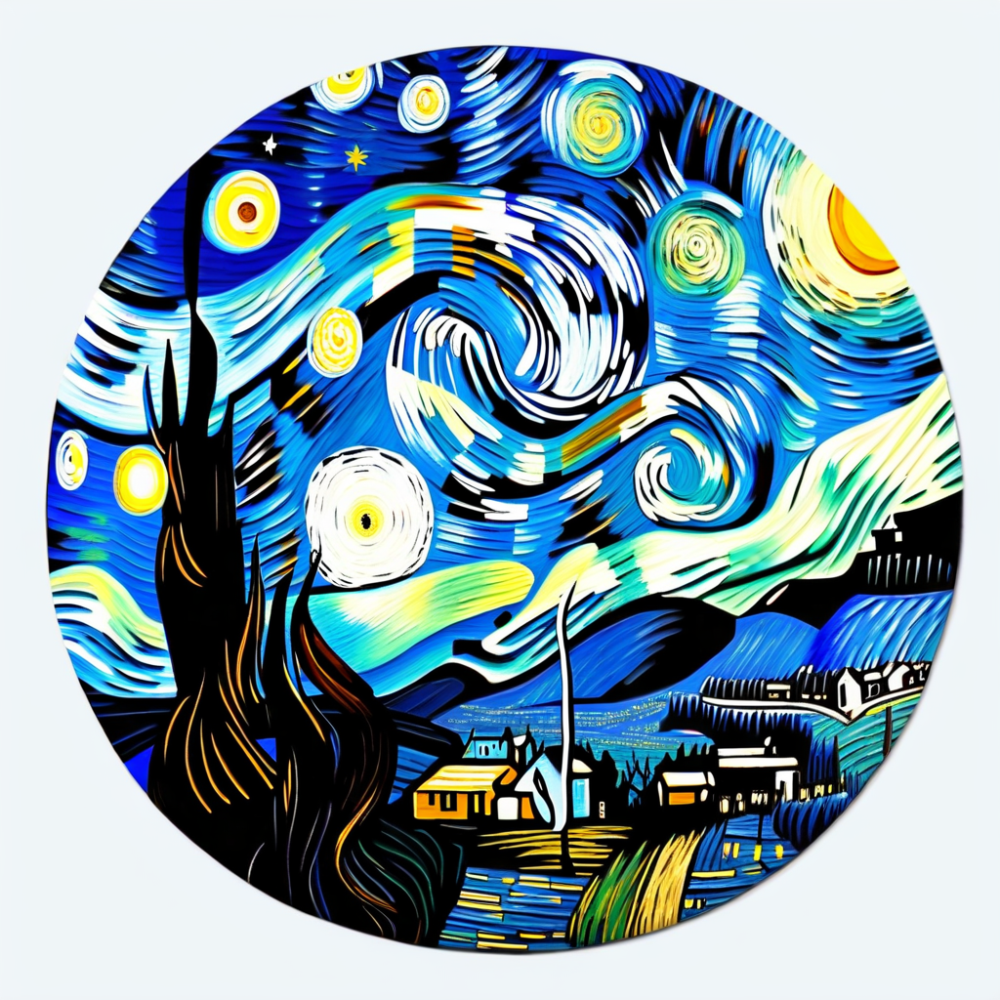

Iteration 1, Image 2: CLIP Similarity = 35.9066047668457


"Prompt: A tall building, a very tall skyscraper in the middle of the North Pole., Van Gogh round painting., CLIP Score: 35.9066047668457"

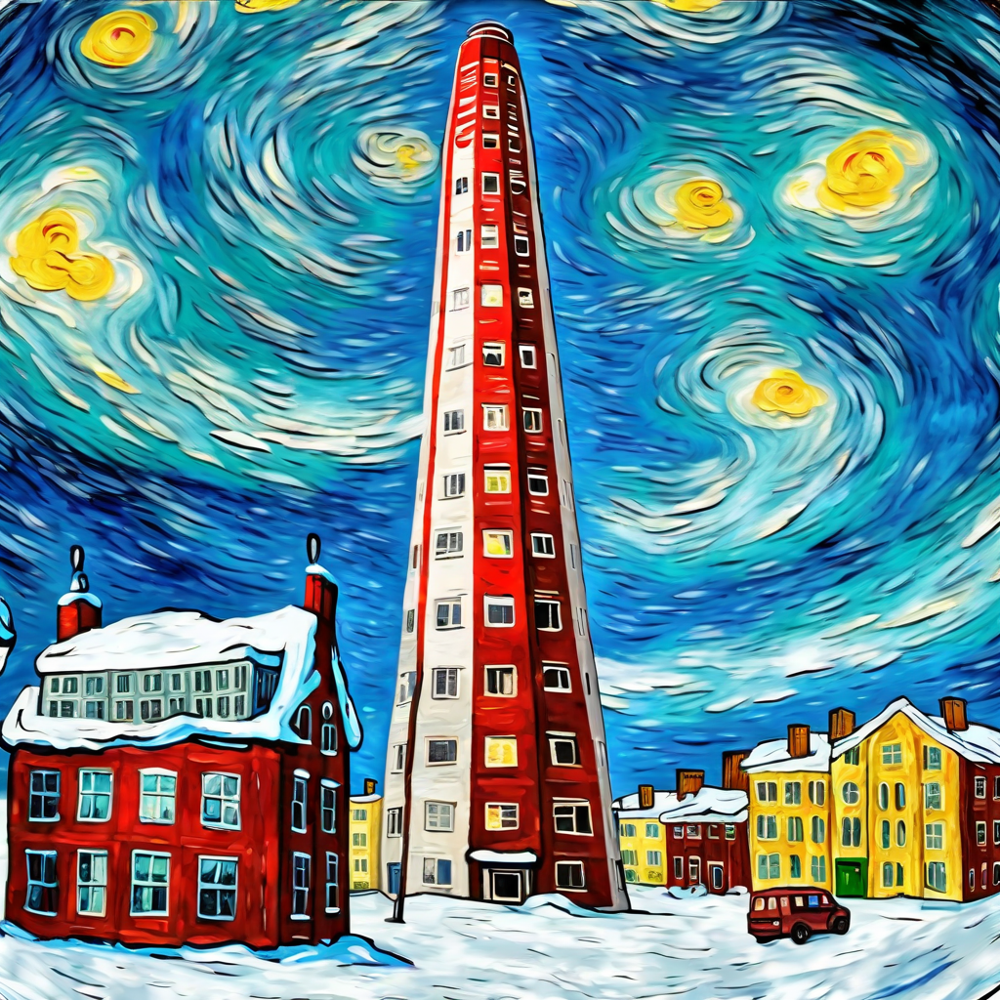

Iteration 1, Image 3: CLIP Similarity = 35.118900299072266


"Prompt: A polar bear on an iceberg Hey polar bear, eating a fish., Van Gogh round painting., CLIP Score: 35.118900299072266"

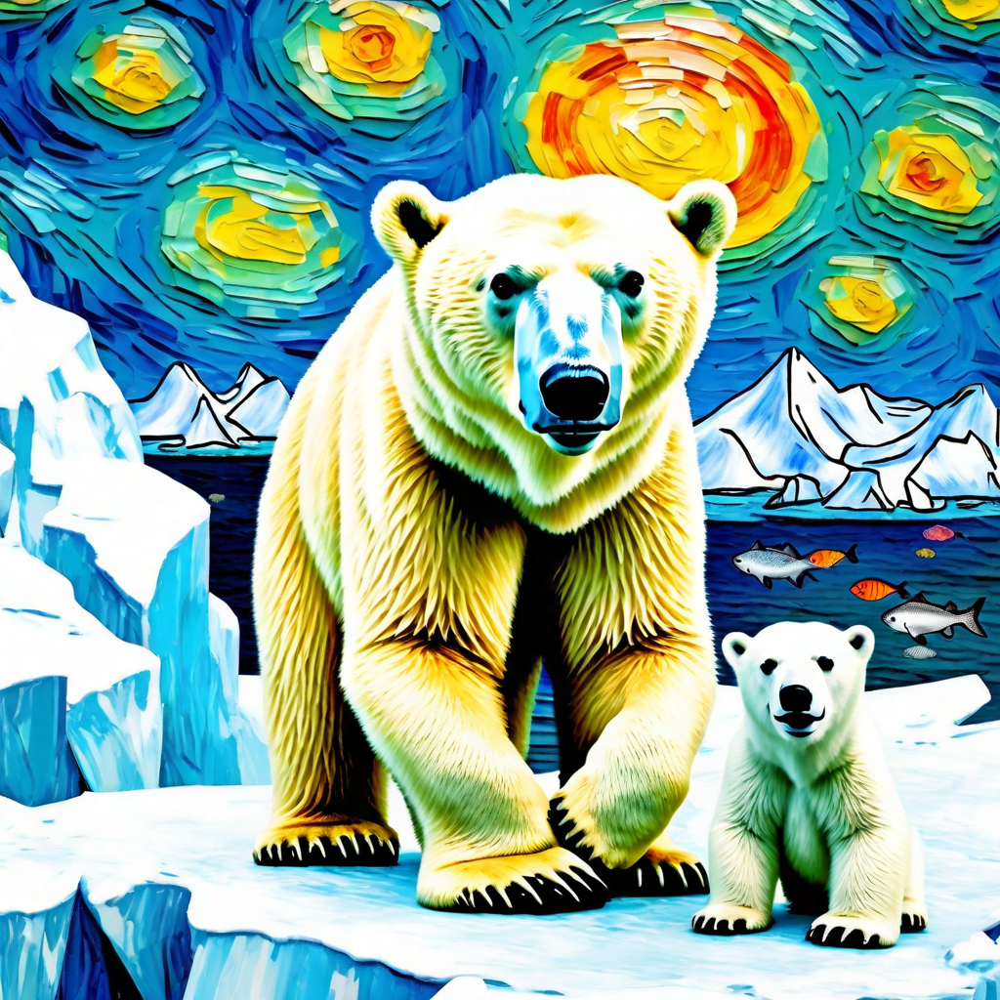

Iteration 1, Image 4: CLIP Similarity = 36.518310546875


"Prompt: A snow globe on a table, a crystal ball with a beautiful landscape within it., Van Gogh round painting., CLIP Score: 36.518310546875"

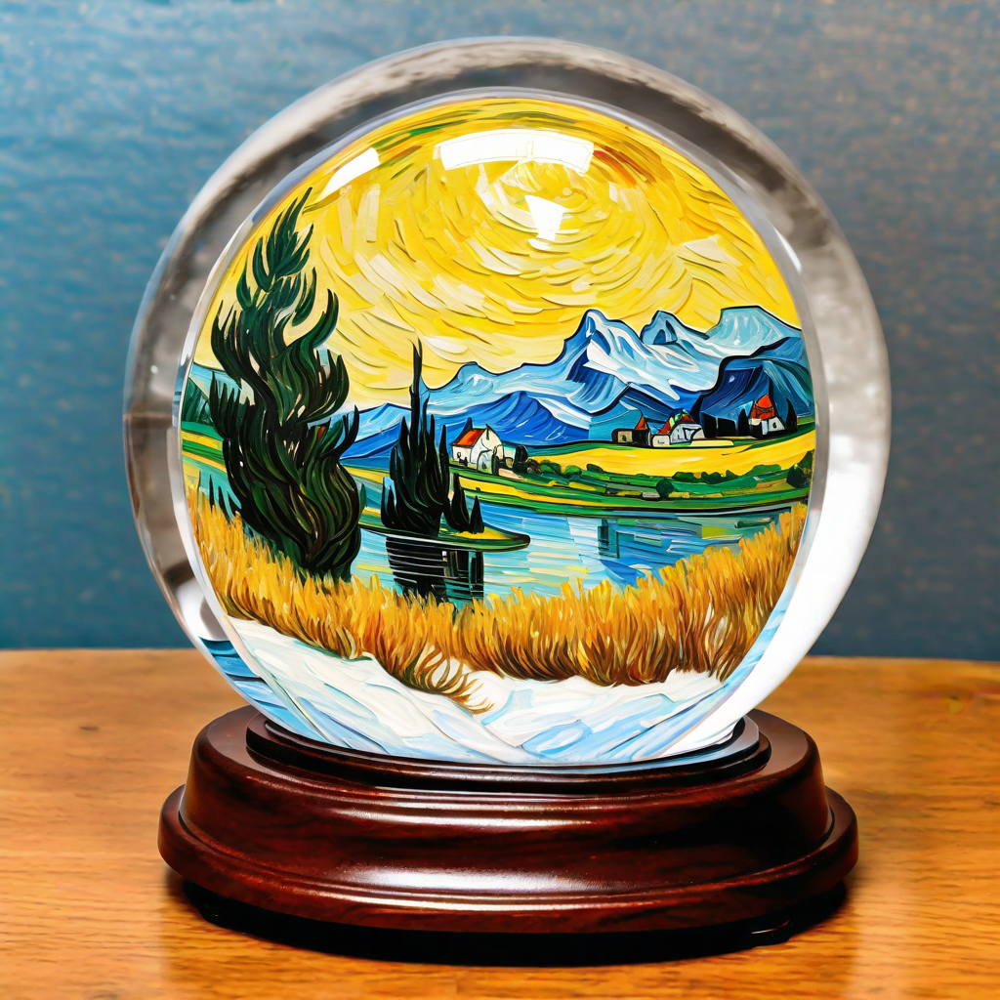

New best score at iteration 1: 35.71876049041748
CLIP similarity reached the threshold at iteration 1.
Best CLIP Score: 35.71876049041748


"Best Prompt: The starry night, Van Gogh round painting.","Best Prompt: A tall building, a very tall skyscraper in the middle of the North Pole., Van Gogh round painting.","Best Prompt: A polar bear on an iceberg Hey polar bear, eating a fish., Van Gogh round painting.","Best Prompt: A snow globe on a table, a crystal ball with a beautiful landscape within it., Van Gogh round painting."

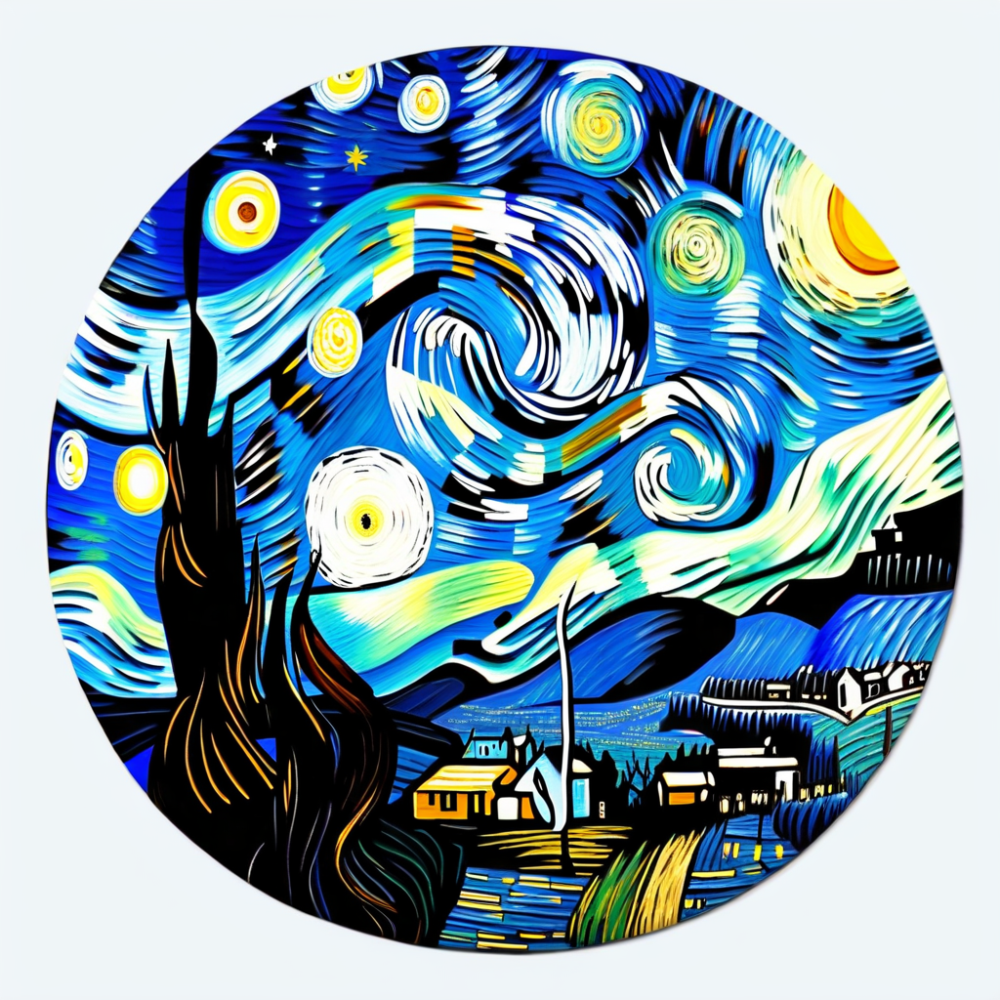
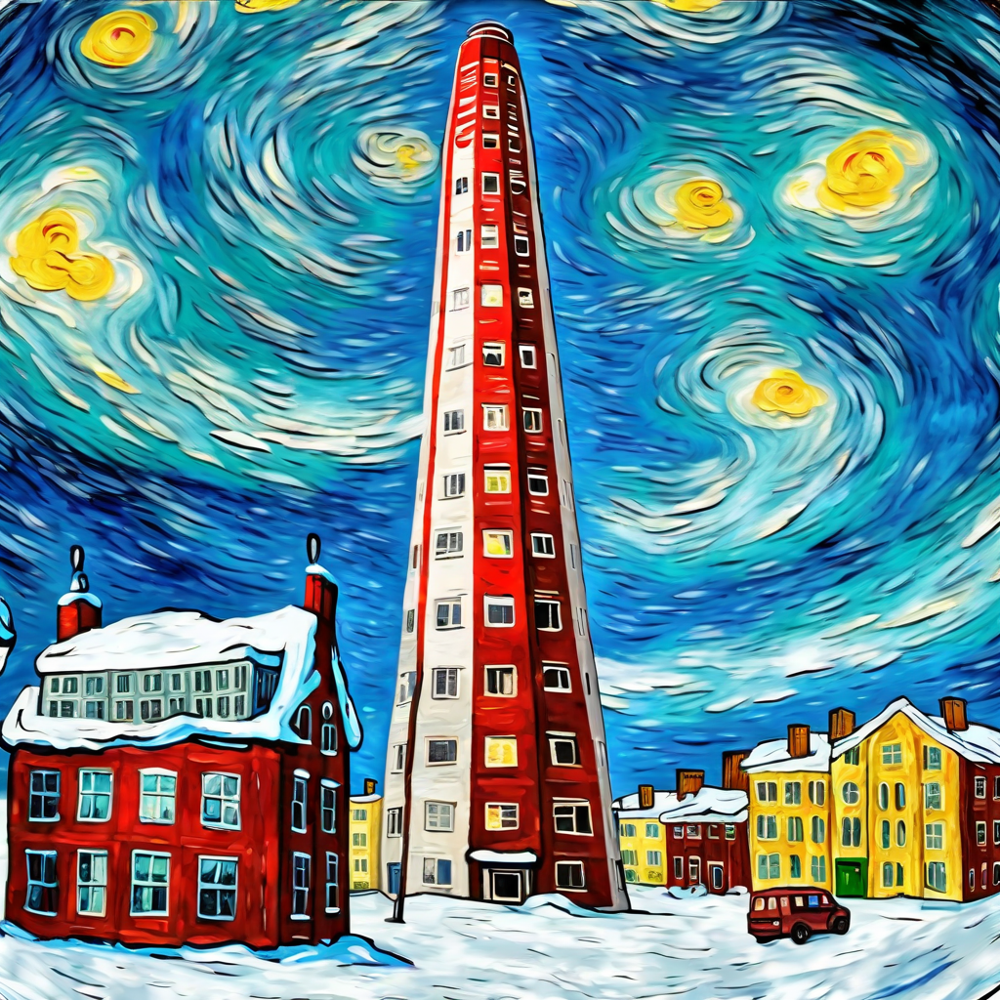
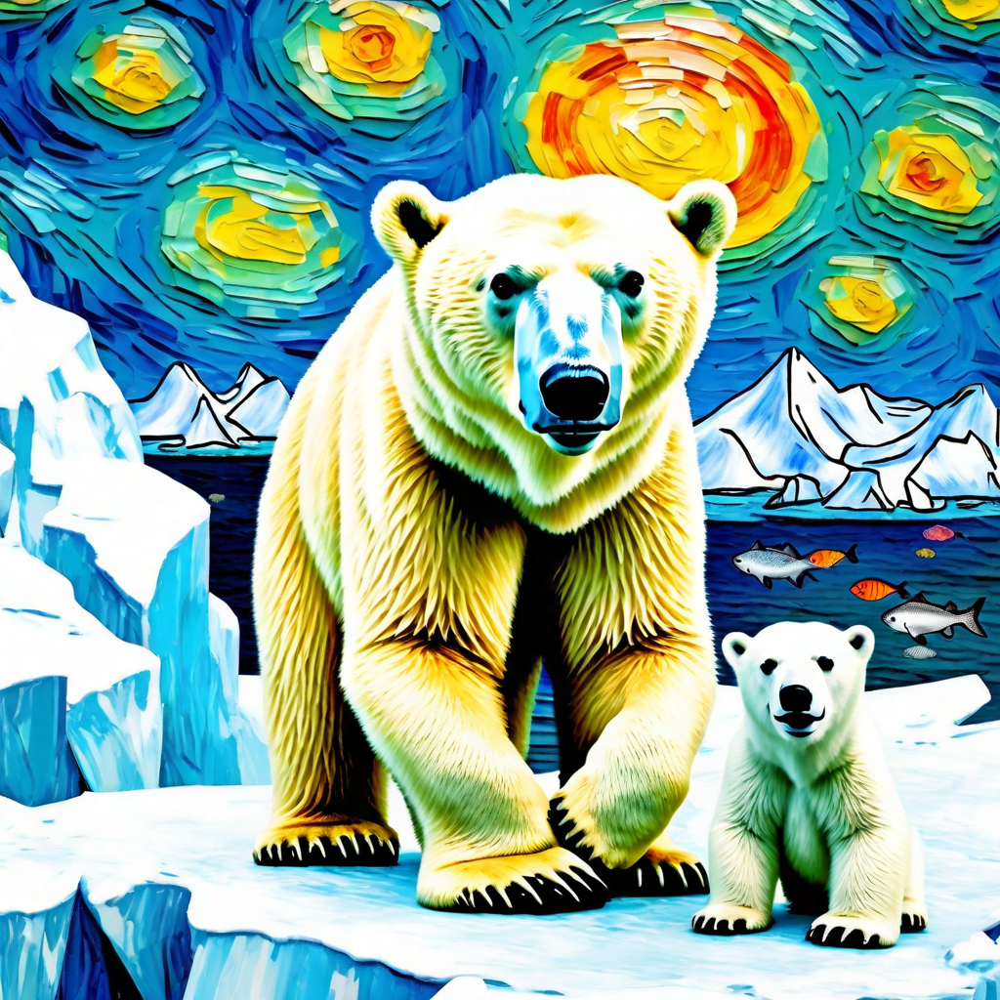
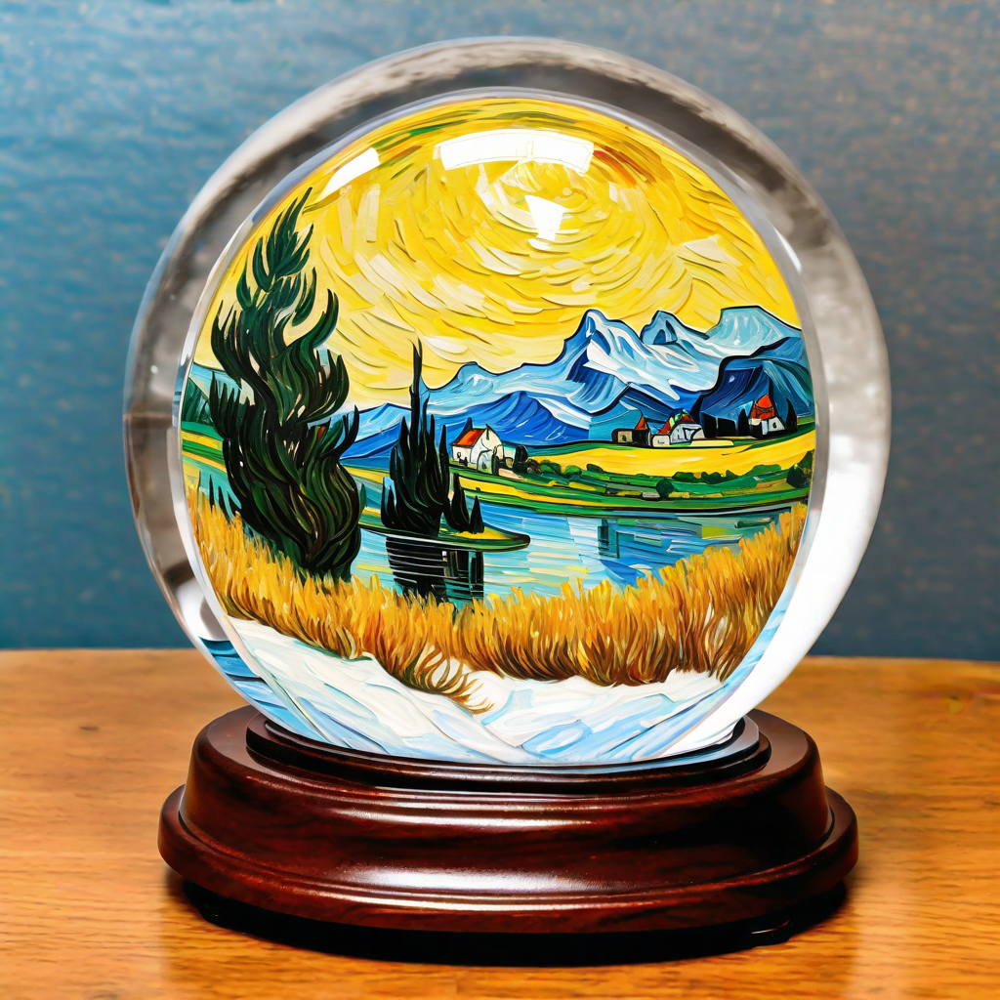

Iteration Memory:  {}


In [24]:
# Execute the Diffusion Inversion Process to map the reference image to its latent representation.
DDIM_inv_result = DDIM_Inversion_Process(Reference_Pipeline, ref_image, src_prompt, num_inference_steps, 2)

# Extract the latent representation from the Diffusion Inversion Result that can be used to guide the generation of new images in the desired style.
latent_vector_ref_img, inversion_callback = extract_latent_and_inversion(DDIM_inv_result, offset=5)

# Create a Random Number Generator on the CPU.
rand_gen = torch.Generator(device='cpu').manual_seed(10)

# Generate the images using the latent representation of the reference image as guidance.
latents = torch.randn(len(prompts), 4, 128, 128,                            # Random Latent Vectors shape
                      device='cpu',                                         # Latent Vectors on CPU.
                      generator=rand_gen,                                   # Random Number Generator.
                      dtype=Reference_Pipeline.unet.dtype,).to('cuda:0')    # Data Type of the Latent Vectors (same as required by the model's UNet).

# Set the first latent vector to the latent representation of the reference image extracted before.
latents[0] = latent_vector_ref_img


# Apply CLIP feedback loop to refine image generation and get the best result
best_images, best_prompts, best_score, iteration_memory = clip_feedback_with_ai(Reference_Pipeline, prompts, latents, num_inference_steps, guidance_scale)

# Display the best generated images and prompts
print(f"Best CLIP Score: {best_score}")
mediapy.show_images(best_images, titles=[f"Best Prompt: {prompt}" for prompt in best_prompts])

# Save the best prompts to a text file
with open("best_prompts.txt", "w") as f:
    for prompt in best_prompts:
        f.write(f"{prompt}\n")

# Clear the handler after the process
handler.remove()

# Print iteration memory to track the evolution of prompts
print("Iteration Memory: ", iteration_memory)
